# Project 5: Vehicle Detection

The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector. 
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.

---

## P4 - Lane Detection

### Imports

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib qt
%matplotlib inline

### Pipeline Functions

#### 1. Undistortion

In [2]:
# Use camera matrix and distance coefficients calculated in P4
mtx = np.array([[1.15396093e+03, 0.00000000e+00, 6.69705357e+02], [0.00000000e+00, 1.14802496e+03, 3.85656234e+02], [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])
dist = np.array([[-2.41017956e-01, -5.30721173e-02, -1.15810355e-03, -1.28318856e-04, 2.67125290e-02]])

# Little wrapper for cv2.undistort(...) 
def undistort(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

#### 2. Create binary image

##### S-channel isolation & thresholding

In [3]:
# Isolate and threshold S channel
def hls_select(rgb_undist, thresh=(0, 255)):
    hls_undist = cv2.cvtColor(rgb_undist, cv2.COLOR_RGB2HLS).astype(np.float)
    s_channel = hls_undist[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

##### Try out various gradients / thresholds

In [4]:
# Calculate directional gradient & apply threshold
def abs_sobel_thresh(gray, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # 1) Take the derivative in x or y given orient = 'x' or 'y'
    if orient is 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient is 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 2) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # 3) Scale to 8-bit (0-255), then convert to np.uint8
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    
    # 4) Create a mask of 1's where the scaled gradient magnitude is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    return binary_output

In [5]:
# Pre-pipeline to undistort an image and return a thresholded binary
def pre_pipeline(image, s_threshold=(170, 255), sobel_threshold=(20, 100), ksize=3, is_rgb=False):
    # Convert to RGB
    if is_rgb:
        rgb = image
    else:
        rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Size
    img_size = (rgb.shape[1], rgb.shape[0])

    # Undistort
    rgb_undist = undistort(rgb)
    
    # Convert to grayscale
    gray_undist = cv2.cvtColor(rgb_undist, cv2.COLOR_RGB2GRAY)

    # Isolate S channel
    s_binary = hls_select(rgb_undist, thresh=s_threshold)
    
    # Apply Sobel in x-direction
    grad_x = abs_sobel_thresh(gray_undist, orient='x', sobel_kernel=ksize, thresh=sobel_threshold)

    # Stack
    color_binary = np.dstack((np.zeros_like(grad_x), grad_x, s_binary))

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(grad_x)
    combined_binary[(s_binary == 1) | (grad_x == 1)] = 1

    return rgb_undist, color_binary, combined_binary

#### 3. Perspective transform

In [6]:
# Transform an image into bird's-eye view
# Optionally, plot the original and the warped image, including the source and destination points
def perspective_transform(combined_binary):
    img_size = (combined_binary.shape[1], combined_binary.shape[0])
    
    # Define source and destination points
    # (starting top left, going clockwise)
    src = np.float32([[585, img_size[1] - 270], [685, img_size[1] - 270], [1110, img_size[1]], [210, img_size[1]]])
    dst = np.float32([[(img_size[0] / 4), 0], [(img_size[0] * 3 / 4), 0], [(img_size[0] * 3 / 4), img_size[1]], [(img_size[0] / 4), img_size[1]]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    binary_warped = cv2.warpPerspective(combined_binary, M, img_size, flags=cv2.INTER_LINEAR)
    
    return binary_warped, M_inv

#### 4. Finding lane lines

In [7]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30 / 720 # meters per pixel in y dimension
xm_per_pix = 3.7 / 700 # meters per pixel in x dimension

In [8]:
# Helper to quickly solve second degree polynoms
def solve(y, poly):
    return poly[0] * y**2 + poly[1] * y + poly[2]

##### Thorough approach

In [9]:
# Find lane lins in a binary image using the histogram approach
# Optionally, plot a visualization and the histogram
def find_lane_lines_init(binary_warped):

    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0] / 2:,:], axis=0)

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    # Improvement: discard very left/right parts of the image/road
    midpoint = np.int(histogram.shape[0] / 2)
    left = np.int(histogram.shape[0] * 0.1)
    right = np.int(histogram.shape[0] * 0.9)
    leftx_base = np.argmax(histogram[left:midpoint]) + left
    rightx_base = np.argmax(histogram[midpoint:right]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9

    # Set height of windows
    window_height = np.int(binary_warped.shape[0] / nwindows)

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Set the width of the windows +/- margin
    margin = 50

    # Set minimum number of pixels found to recenter window
    minpix = 80

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high,win_y_high), (0, 255, 0), 2) 
        cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high,win_y_high), (0, 255, 0), 2)

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Fit in m
    left_fit_m = np.polyfit(lefty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit_m = np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])
    left_fitx = solve(ploty, left_fit)
    right_fitx = solve(ploty, right_fit)
    
    return left_fit, right_fit, left_fitx, right_fitx, left_fit_m, right_fit_m, ploty

##### Optimized approach

In [10]:
# Optimized algorithm, when intitial fits already exist
# Optionally, plot a visualization
def find_lane_lines_2(binary_warped, left_fit, right_fit):

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Set the width of the windows +/- margin
    margin = 50
    
    # Identify the nonzero pixels in x and y within the window
    left_lane_inds = ((nonzerox > (left_fit[0] * (nonzeroy**2) + left_fit[1] * nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0] * (nonzeroy**2) + left_fit[1] * nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0] * (nonzeroy**2) + right_fit[1] * nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0] * (nonzeroy**2) + right_fit[1] * nonzeroy + right_fit[2] + margin)))  
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Fit in m
    left_fit_m = np.polyfit(lefty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit_m = np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])
    left_fitx = solve(ploty, left_fit)
    right_fitx = solve(ploty, right_fit)
        
    return left_fit, right_fit, left_fitx, right_fitx, left_fit_m, right_fit_m, ploty

##### Curvature & Offset

In [11]:
# Calculate the curve radius in m
def calc_curve_rad_m(left_fit, right_fit, ploty):

    # Define y-value where we want radius of curvature (bottom of image)
    y_eval = np.max(ploty)

    # Calculate the new radii of curvature
    left_curverad = ((1 + (2 * left_fit[0] * y_eval + left_fit[1])**2)**1.5) / np.absolute(2 * left_fit[0])
    right_curverad = ((1 + (2 * right_fit[0] * y_eval + right_fit[1])**2)**1.5) / np.absolute(2 * right_fit[0])

    return round(left_curverad, 2), round(right_curverad, 2)

In [12]:
# Calculate the offset between car and the lane center
def calc_offset(left_fit, right_fit, img_size):
    left_lane_x = solve(img_size[0], left_fit)
    right_lane_x = solve(img_size[0], right_fit)

    lane_center = (left_lane_x + right_lane_x) / 2.0

    return round((lane_center - img_size[0] / 2) * xm_per_pix, 2)

#### 5. Augment the Image

In [13]:
# Add the text overlay to an image
def text_overlay(image, left_fit, right_fit, left_fit_m, right_fit_m, ploty, original_image):
    left_curverad, right_curverad = calc_curve_rad_m(left_fit_m, right_fit_m, ploty)
    offset = calc_offset(left_fit, right_fit, (original_image.shape[1], original_image.shape[0]))

    text = 'Left: ' + str(left_curverad) + 'm, right: ' + str(right_curverad) + 'm. Offset: ' + str(offset) + 'm'
    cv2.putText(image, text, (10, 50), cv2.FONT_HERSHEY_PLAIN, 2, (255, 0, 0), 2, cv2.LINE_AA)

In [14]:
# Augment an image with the lane and additional text
def augment_image(binary_warped, left_fit, right_fit, left_fitx, right_fitx, left_fit_m, right_fit_m, ploty, M_inv, original_image):

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    new_warp = cv2.warpPerspective(color_warp, M_inv, (original_image.shape[1], original_image.shape[0])) 

    # Combine the result with the original image
    result = cv2.addWeighted(original_image, 1, new_warp, 0.3, 0)

    # Add curvature and offset information
    text_overlay(result, left_fit, right_fit, left_fit_m, right_fit_m, ploty, original_image)
    
    return result

#### 6. Final Pipeline

In [15]:
# Settings for smoothing
smoothing = True
smooth_buffer_size = 12

# Settings for sanity check
lane_width = 700
lane_width_deviation = 200
insane_patience = 5

In [16]:
# Check if lane lines are separated by reasonable distance
# (check performed at bottom and top, as well as in the middle of the image)
def sanity_check(left_fit, right_fit, height):
    a_l = solve(height, left_fit)
    b_l = solve(height / 2, left_fit)
    c_l = solve(0, left_fit)
    
    a_r = solve(height, right_fit)
    b_r = solve(height / 2, right_fit)
    c_r = solve(0, right_fit)
    
    bot_dist_sane = lane_width - lane_width_deviation < (a_r - a_l) < lane_width + lane_width_deviation
    mid_dist_sane = lane_width - lane_width_deviation < (b_r - b_l) < lane_width + lane_width_deviation
    top_dist_sane = lane_width - lane_width_deviation < (c_r - c_l) < lane_width + lane_width_deviation
    
    return bot_dist_sane and mid_dist_sane and top_dist_sane

-----
## P5 - Vehicle Detection

### Extract Features

In [17]:
from skimage.feature import hog


# Convert RGB to different color space
def convert_color(img, convert_to):
    return cv2.cvtColor(img, eval('cv2.COLOR_RGB2{}'.format(convert_to)))


# Extract HOG features from an image
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell), cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        return features


# Apply spatial binning to an image
def bin_spatial(img, size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))
                     

# Compute the color histogram of an image
def color_hist(img, nbins=32):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    
    # Return the individual histograms, bin_centers and feature vector
    return hist_features



In [18]:
# Extract the desired features from an image (provided as image object) and return them as feature array
def single_img_features(img, color_space='RGB', spatial_size=(32, 32), hist_bins=32, orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0, spatial_feat=True, hist_feat=True, hog_feat=True, vis=False):
    
    #1) Define an empty list to receive features
    img_features = []
    
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        feature_image = convert_color(img, color_space)
    else:
        feature_image = np.copy(img)
   
    #3) Compute spatial features if flag is set
    if spatial_feat:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        
        #4) Append features to list
        img_features.append(spatial_features)
        
    #5) Compute histogram features if flag is set
    if hist_feat:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        
        #6) Append features to list
        img_features.append(hist_features)
        
    #7) Compute HOG features if flag is set
    if hog_feat:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True))      
        else:
            if vis:
                hog_features, hog_image = get_hog_features(feature_image[:,:,hog_channel], orient, pix_per_cell, cell_per_block, vis=True, feature_vec=True)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    if vis:
        return np.concatenate(img_features), hog_image
    else:
        return np.concatenate(img_features)

In [19]:
# Extract features from a list of images (provided as filenames)
# Basically a wrapper for single_img_features(...)
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32), hist_bins=32, orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0, spatial_feat=True, hist_feat=True, hog_feat=True):
    
    # Create a list to append feature vectors to
    features = []
    
    # Iterate through the list of images
    for file in imgs:
        # Read image
        img = mpimg.imread(file)
        
        # Extract features from single image
        img_features = single_img_features(img, color_space=color_space, spatial_size=spatial_size, hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel, spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)  
       
        # Append features of this single image to total feature list
        features.append(img_features)
        
    # Return list of feature vectors
    return features

### Read Images

In [20]:
import glob


cars = glob.glob('vehicles/*/*.png')
not_cars = glob.glob('non-vehicles/*/*.png')
print('Number of car images:', len(cars))
print('Number of non-car images:', len(not_cars))

Number of car images: 8792
Number of non-car images: 8968


### Test visualizations of random image (using various parameters)


In [21]:
# Helper for plotting several images (based on Ryan's method in the Q&A)
def visualize(imgs, suptitle, titles, size, rows, cols, save=False):
    fig = plt.figure(figsize=size)
    fig.suptitle(suptitle, fontsize=14)
    
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i + 1)
        dims = len(img.shape)
        if dims < 3:
            plt.imshow(img, cmap='hot')
        else:
            plt.imshow(img)
        plt.title(titles[i])
    
    fig.savefig('output_images/' + suptitle + '.jpg')

/Users/B/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


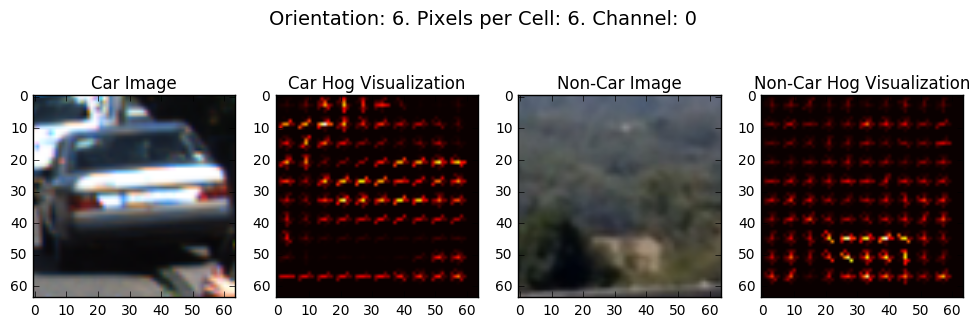

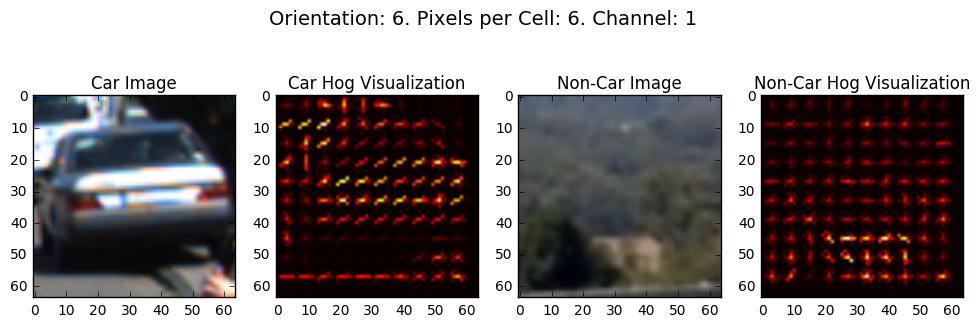

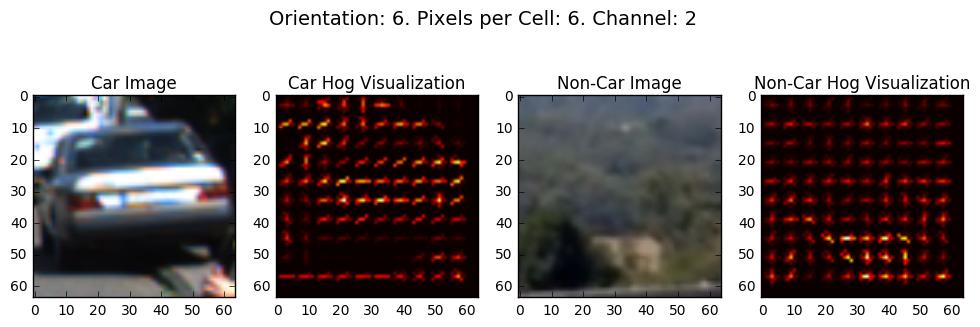

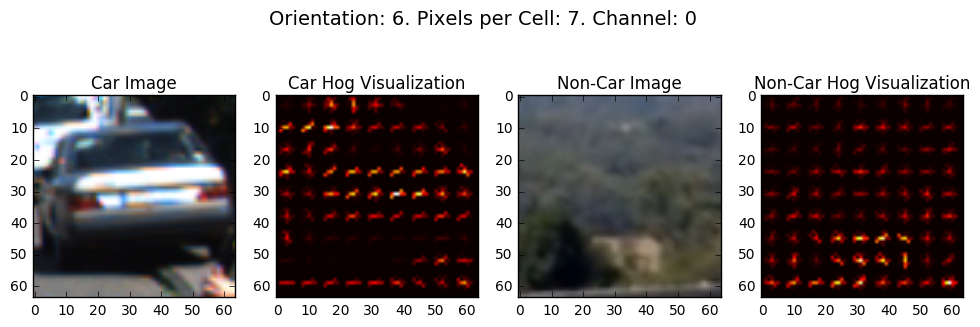

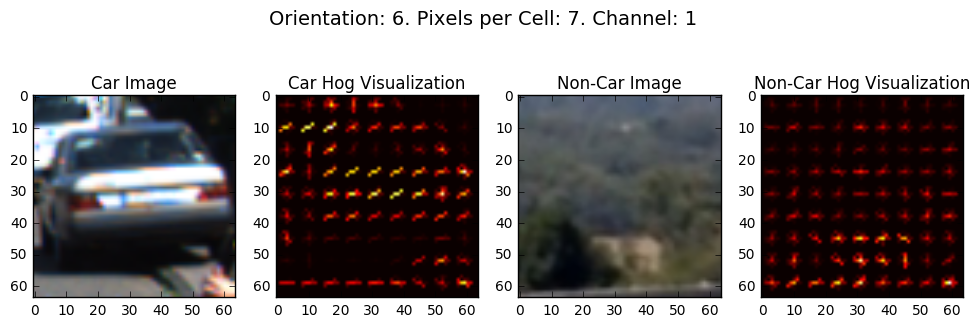

...

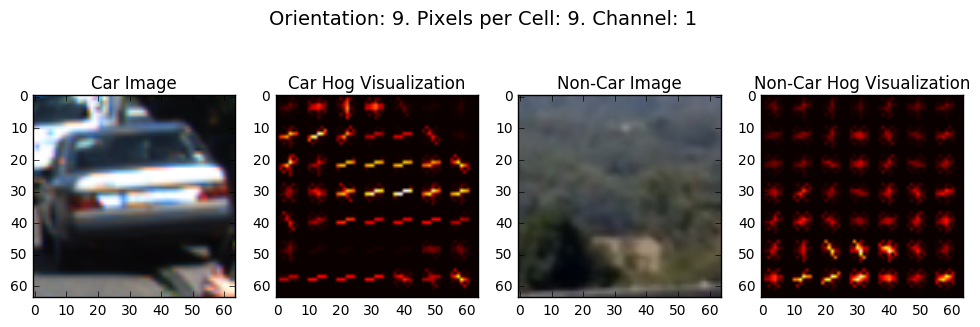

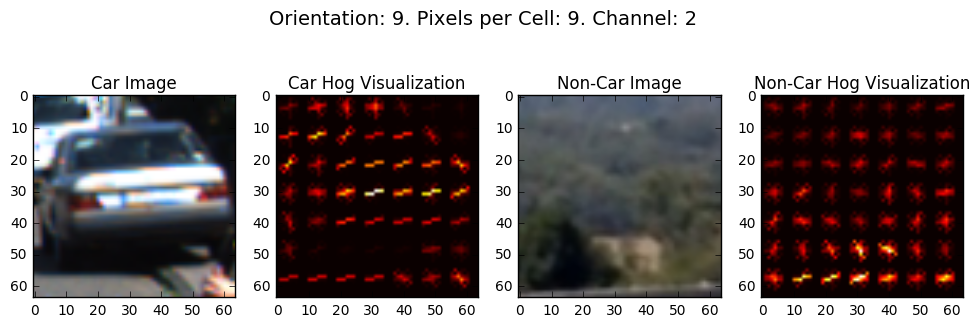

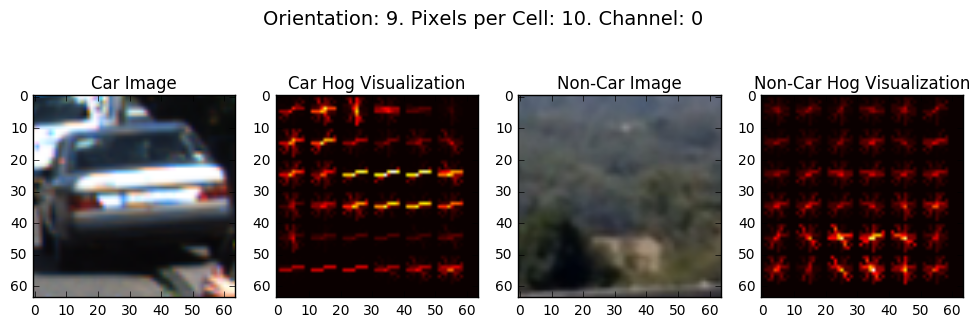

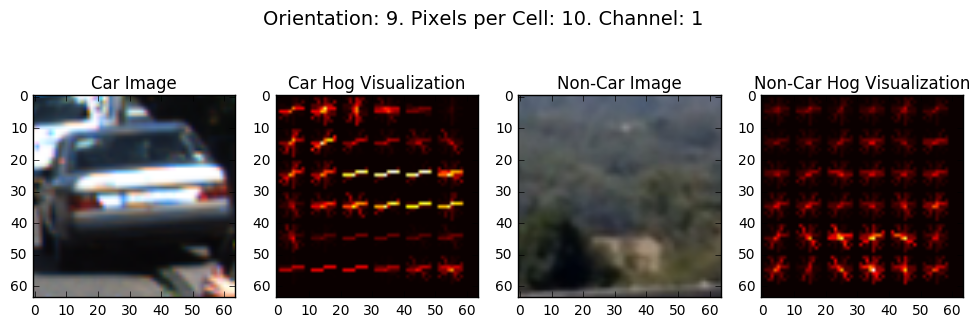

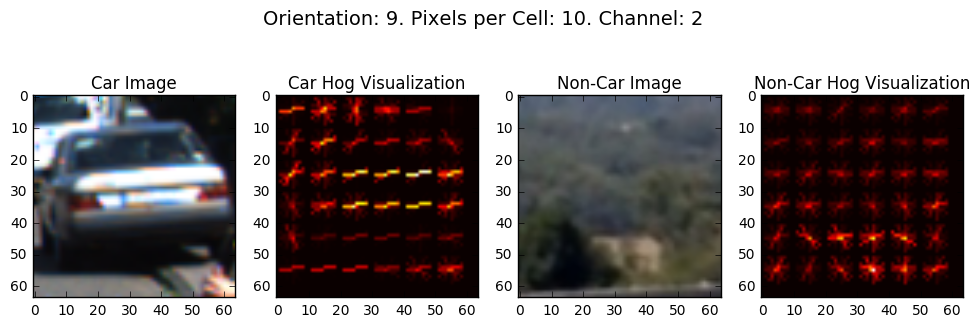

In [22]:
import matplotlib.image as mpimg


# Settings for test
color_space = 'RGB'     # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9              # HOG orientations
pix_per_cell = 8        # HOG pixels per cell
cell_per_block = 2      # HOG cells per block
hog_channel = 1         # Can be 0, 1, 2, or 'ALL'
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32          # Number of histogram bins
spatial_feat = True     # Spatial features on or off
hist_feat = True        # Histogram features on or off
hog_feat = True         # HOG features on or off
n_samples = -1          # Number of samples (to limit training for testing purposes). Set to -1 for unlimited


# Choose random indices
car_indices = np.random.randint(0, len(cars))
not_car_indices = np.random.randint(0, len(not_cars))

# Read images
car_img = mpimg.imread(cars[car_indices])
not_car_img = mpimg.imread(not_cars[not_car_indices])

# Try and visualize some combinations
for orient in range(6, 10):
    for pix_per_cell in range (6, 11):
        for hog_channel in range (0, 3):
        # Cells per block always 2
            car_features, car_hog_img = single_img_features(car_img, color_space=color_space, 
                                        spatial_size=spatial_size, hist_bins=hist_bins, 
                                        orient=orient, pix_per_cell=pix_per_cell, 
                                        cell_per_block=cell_per_block, 
                                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                                        hist_feat=hist_feat, hog_feat=hog_feat, vis=True)
            not_car_features, not_car_hog_img = single_img_features(not_car_img, color_space=color_space, 
                                                spatial_size=spatial_size, hist_bins=hist_bins, 
                                                orient=orient, pix_per_cell=pix_per_cell, 
                                                cell_per_block=cell_per_block, 
                                                hog_channel=hog_channel, spatial_feat=spatial_feat, 
                                                hist_feat=hist_feat, hog_feat=hog_feat, vis= True)

            images = [car_img, car_hog_img, not_car_img, not_car_hog_img]
            titles = ['Car Image', 'Car Hog Visualization', 'Non-Car Image', 'Non-Car Hog Visualization']
            visualize(images, 'Orientation: {}. Pixels per Cell: {}. Channel: {}'.format(orient, pix_per_cell, hog_channel), titles, (12, 4), 1, 4, save=True)

### Train the Classifier

In [23]:
# Settings for training
color_space = 'YCrCb'   # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9              # HOG orientations
pix_per_cell = 7        # HOG pixels per cell
cell_per_block = 2      # HOG cells per block
hog_channel = 'ALL'     # Can be 0, 1, 2, or 'ALL'
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32          # Number of histogram bins
spatial_feat = True     # Spatial features on or off
hist_feat = True        # Histogram features on or off
hog_feat = True         # HOG features on or off
n_samples = -1          # Number of samples (to limit training for testing purposes). Set to -1 for unlimited

In [24]:
import time

from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split


if n_samples != -1:
    random_indices = np.random.randint(0, len(not_cars), n_samples)
    sample_cars = np.array(cars)[random_indices]
    sample_not_cars = np.array(not_cars)[random_indices]
else:
    sample_cars = cars
    sample_not_cars = not_cars
    
t = time.time()

car_features = extract_features(sample_cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
not_car_features = extract_features(sample_not_cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

print(round(time.time() - t, 2), 'seconds to extract all features')

X = np.vstack((car_features, not_car_features)).astype(np.float64)

# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)

# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(not_car_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:', orient, 'orientations,', pix_per_cell, 'pixels per cell,', cell_per_block, 'cells per block,', hog_channel, 'channels,', hist_bins, 'histogram bins,', spatial_size, 'spatial size, and', color_space, 'colorspace')
print('Feature vector length:', len(X_train[0]))

# Use a linear SVC 
svc = LinearSVC()

# Check the training time for the SVC
t = time.time()
svc.fit(X_train, y_train)
print(round(time.time() - t, 2), 'seconds to train the SVC')

# Check the score of the SVC
print('Test Accuracy of SVC =', round(svc.score(X_test, y_test), 4))

108.33 seconds to extract all features
Using: 9 orientations, 7 pixels per cell, 2 cells per block, ALL channels, 32 histogram bins, (32, 32) spatial size, and YCrCb colorspace
Feature vector length: 10080
28.46 seconds to train the SVC
Test Accuracy of SVC = 0.9918


### Processing Video Frames

In [25]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, y_start, y_stop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, draw=False):
    draw_img = np.copy(img)
    heatmap = np.zeros_like(img[:,:,0])
    img = img.astype(np.float32) / 255
    
    img_tosearch = img[y_start:y_stop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, 'YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1] / scale), np.int(imshape[0] / scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1 
    nfeat_per_block = orient * cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - 1 
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    n_windows = 0
    for xb in range(nxsteps):
        for yb in range(nysteps):
            n_windows += 1
            y_pos = yb * cells_per_step
            x_pos = xb * cells_per_step
            
            # Extract HOG for this patch
            hog_feat1 = hog1[y_pos:y_pos + nblocks_per_window, x_pos:x_pos + nblocks_per_window].ravel() 
            hog_feat2 = hog2[y_pos:y_pos + nblocks_per_window, x_pos:x_pos + nblocks_per_window].ravel() 
            hog_feat3 = hog3[y_pos:y_pos + nblocks_per_window, x_pos:x_pos + nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            x_left = x_pos * pix_per_cell
            y_top = y_pos * pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[y_top:y_top + window, x_left:x_left + window], (64, 64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))
            test_prediction = svc.predict(test_features)
            
            if test_prediction:
                x_box_left = np.int(x_left * scale)
                y_top_draw = np.int(y_top * scale)
                win_draw = np.int(window * scale)
                box = ((x_box_left, y_top_draw + y_start), (x_box_left + win_draw, y_top_draw + win_draw + y_start))
                if draw:
                    cv2.rectangle(draw_img, box[0], box[1], (0, 0, 255), 6)
                heatmap[y_top_draw + y_start:y_top_draw + y_start + win_draw, x_box_left:x_box_left + win_draw] += 1
                
    if draw:        
        print('Searching ', n_windows, 'windows')
        return draw_img, heatmap
    else:
        return heatmap

In [26]:
# Apply a threshold to a heatmap
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    
    return heatmap


# Draw bounding boxes on an img based on the location of labels
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1] + 1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0, 0, 255), 6)
        
    return img

#### Run Vehicle Detection on Test Images

In [27]:
# Settings for vehicle detection
# (different start/stop and scale values for 2 scans)
y_start = [372, 400]
y_stop = [592, 656]
scale = [1.3, 1.5]
heatmap_threshold = 1

# X_scaler + svc defined above

Searching  455 windows
Searching  392 windows
1.04 seconds to make a prediction
Searching  455 windows
Searching  392 windows
0.94 seconds to make a prediction
Searching  455 windows
Searching  392 windows
0.93 seconds to make a prediction
Searching  455 windows
Searching  392 windows
0.92 seconds to make a prediction
Searching  455 windows
Searching  392 windows
1.01 seconds to make a prediction
Searching  455 windows
Searching  392 windows
0.98 seconds to make a prediction


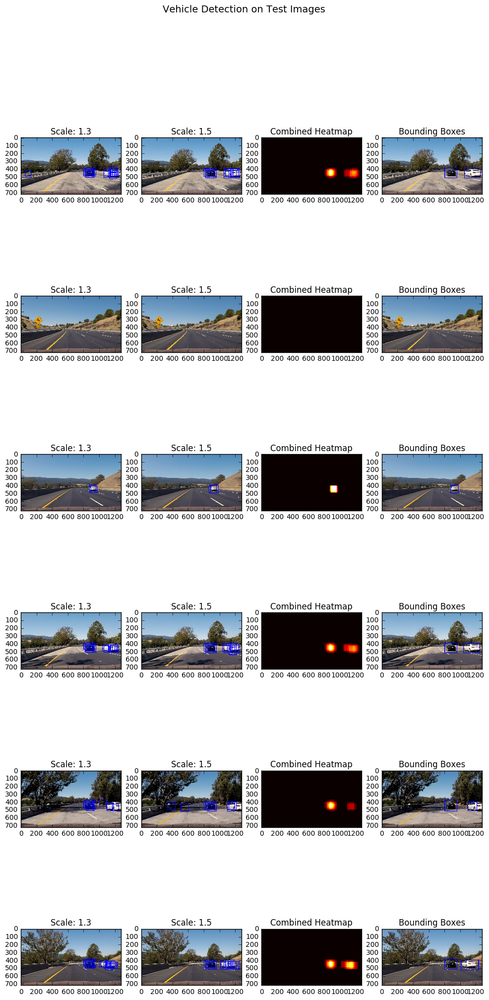

In [28]:
from scipy.ndimage.measurements import label


test_images = glob.glob('test_images/*.jpg')

images = []
titles = []

# Iterate through the list of images
for file in test_images:
    # Read image
    img = mpimg.imread(file)
    
    # Make and time prediction
    t = time.time()
    
    out_img, heatmap = find_cars(img, y_start[0], y_stop[0], scale[0], svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, draw=True)
    out_img2, heatmap2 = find_cars(img, y_start[1], y_stop[1], scale[1], svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, draw=True)    

    heatmap = heatmap + heatmap2
    
    print(round(time.time() - t, 2), 'seconds to make a prediction')
    
    heatmap = apply_threshold(heatmap, 1)  # No accumulation over several frames, so no harsh thresholding
    
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    
    # Prepare visualization
    images.append(out_img)
    titles.append('Scale: ' + str(scale[0]))
    images.append(out_img2)
    titles.append('Scale: ' + str(scale[1]))
    images.append(heatmap)
    titles.append('Combined Heatmap')
    images.append(draw_img)
    titles.append('Bounding Boxes')
    
visualize(images, 'Vehicle Detection on Test Images', titles, (12, 24), 6, 4, save=True)

### Pipelines for Lane & Vehicle Detection

In [29]:
# Identify and highlight lanes
def lane_pipeline(image):
    global left_fit
    global right_fit
    
    global left_fit_avg
    global right_fit_avg
    global left_fitx_avg
    global right_fitx_avg
    global ploty_avg
    
    global step
    global counter
    global rejection_counter
    global enough
    
    global insane_in_row
    global insane_patience
    
    counter += 1
    
    # 1. Process image to create a thresholded binary image where (ideally) only lane lines are visible in white
    rgb_undist, _, combined_binary = pre_pipeline(image, is_rgb=True)
    
    # 2. Warp image
    binary_warped, M_inv = perspective_transform(combined_binary)
    
    # 3. Find lane lines in image and return their curves (use more advanced technique if there was a previous frame)
    # Also reset if too many frames in a row did not pass the sanity check
    if (left_fit is not None and right_fit is not None) and insane_in_row < insane_patience:        
        left_fit, right_fit, left_fitx, right_fitx, left_fit_m, right_fit_m, ploty = find_lane_lines_2(binary_warped, left_fit, right_fit)
    else:
        left_fit_avg = np.empty(smooth_buffer_size, dtype=object)
        right_fit_avg = np.empty(smooth_buffer_size, dtype=object)
        left_fitx_avg = np.empty(smooth_buffer_size, dtype=object)
        right_fitx_avg = np.empty(smooth_buffer_size, dtype=object)
        ploty_avg = np.empty(smooth_buffer_size, dtype=object)
        enough = False
        step = 0
        insane_in_row = 0
        
        left_fit, right_fit, left_fitx, right_fitx, left_fit_m, right_fit_m, ploty = find_lane_lines_init(binary_warped)
    
    # Sanity check
    if sanity_check(left_fit, right_fit, image.shape[0]):
        left_fit_avg[step] = left_fit
        right_fit_avg[step] = right_fit
        left_fitx_avg[step] = left_fitx
        right_fitx_avg[step] = right_fitx
        ploty_avg[step] = ploty

        step += 1
    else:
        rejection_counter += 1
        insane_in_row += 1            
        
    if step >= smooth_buffer_size:
        enough = True
        step = 0
        
    # Smooth by averaging if enabled and enough frames captured
    if enough and smoothing:
        left_fit = np.mean(left_fit_avg)
        right_fit = np.mean(right_fit_avg)
        left_fitx = np.mean(left_fitx_avg)
        right_fitx = np.mean(right_fitx_avg)
        ploty = np.mean(ploty_avg)

    # 4. Augment image with lane and text overlays
    return augment_image(binary_warped, left_fit, right_fit, left_fitx, right_fitx, left_fit_m, right_fit_m, ploty, M_inv, rgb_undist)


In [30]:
# Draw bounding boxes for found cars in a frame
def vehicle_pipeline(img):
    global heatmap_step
    global heatmap_buffer
    
    heatmap_step += 1
    if heatmap_step >= heatmap_buffer_size:
        heatmap_step = 0
    
    # Find cars using different window areas and scales
    heatmap = find_cars(img, y_start[0], y_stop[0], scale[0], svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    heatmap += find_cars(img, y_start[1], y_stop[1], scale[1], svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

    # Add up heatmap
    heatmap_buffer[heatmap_step] = heatmap
    
    # Threshold the summed up heatmap
    heatmap = apply_threshold(np.sum(heatmap_buffer), heatmap_threshold)
    
    # Label 'hot' areas in heatmap
    labels = label(heatmap)
    
    # Draw bounding boxes
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    
    return draw_img

### Processing the video

In [31]:
# Combine pipelines for lane and vehicle detection
def process_frame(img):
    img = vehicle_pipeline(img)    
    return lane_pipeline(img)

In [32]:
from moviepy.editor import VideoFileClip


# Initialize variables for lane detection
left_fit = None
right_fit = None

left_fit_avg = np.empty(smooth_buffer_size, dtype=object)
right_fit_avg = np.empty(smooth_buffer_size, dtype=object)
left_fitx_avg = np.empty(smooth_buffer_size, dtype=object)
right_fitx_avg = np.empty(smooth_buffer_size, dtype=object)
ploty_avg = np.empty(smooth_buffer_size, dtype=object)

step = 0
counter = 0
rejection_counter = 0
enough = False
insane_in_row = 0


# Initialize variables for vehicle detection
y_start = [372, 400]
y_stop = [592, 656]
scale = [1.3, 1.5]
heatmap_threshold = 30
heatmap_buffer_size = 20
heatmap_buffer = np.zeros(heatmap_buffer_size, dtype=object)
heatmap_step = 0


# Process video
clip1 = VideoFileClip('project_video.mp4')
clip = clip1.fl_image(process_frame)
%time clip.write_videofile('output.mp4', audio=False)

# Print some stats
print('Total frames: ', counter)
print('Rejected (lane detection): ', rejection_counter)

[MoviePy] >>>> Building video output.mp4
[MoviePy] Writing video output.mp4


100%|█████████▉| 1260/1261 [21:53<00:01,  1.05s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output.mp4 

CPU times: user 21min 47s, sys: 1min 36s, total: 23min 23s
Wall time: 21min 54s
Total frames:  1261
Rejected (lane detection):  58
